In [1]:
import os, sys, re
import h5py
import datetime
import math
from matplotlib.dates import date2num, num2date
import matplotlib.pylab as plt
from modest_image import imshow

data_path = '/Volumes/wjlee_apl_2/ooi_zplsc_h5_figs'
h5_fname = 'CE04OSPS_201509.h5'

f = h5py.File(os.path.join(data_path,h5_fname))

In [2]:
Sv_mtx_reg=f['Sv'][0,:,0:10000]

In [3]:
data_times_reg=f['data_times'][0:10000]

In [6]:
%matplotlib inline

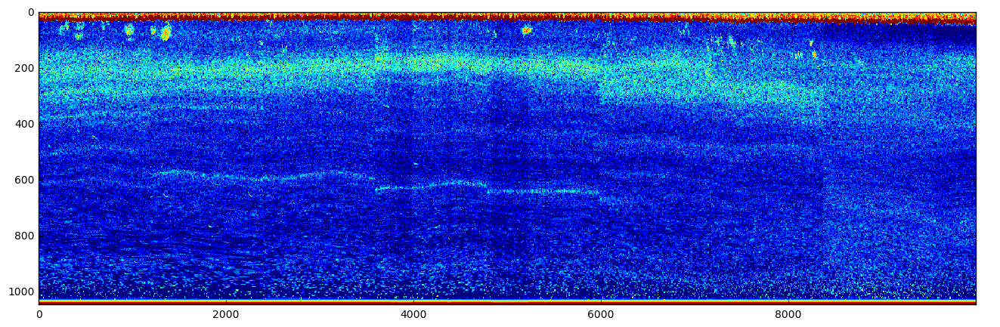

In [7]:
fig, ax = plt.subplots(1, sharex=True)
imshow(ax,Sv_mtx_reg,aspect='auto',vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(16)
fig.set_figheight(5)

In [9]:
num2date(data_times_reg[-1])

datetime.datetime(2015, 9, 1, 8, 7, 7, 361052, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>)

In [10]:
Sv_mtx_reg.shape

(1046, 10000)

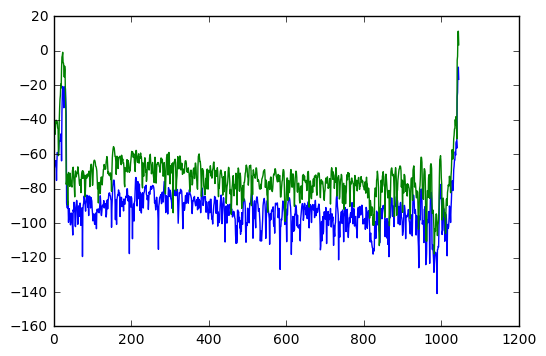

In [12]:
plt.plot(Sv_mtx_reg[:,0])
plt.hold(True)
plt.plot(Sv_mtx_reg[:,1])

In [13]:
num2date(f['data_times'][0:10000:1000])

[datetime.datetime(2015, 9, 1, 0, 0, 0, 82347, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 0, 16, 44, 204782, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 1, 13, 28, 578501, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 10, 10, 942102, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 3, 6, 53, 366707, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 4, 3, 35, 724314, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 5, 0, 18, 103918, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 5, 17, 1, 219298, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 6, 13, 43, 607894, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 7, 10, 26, 24502, tzinfo=<matpl

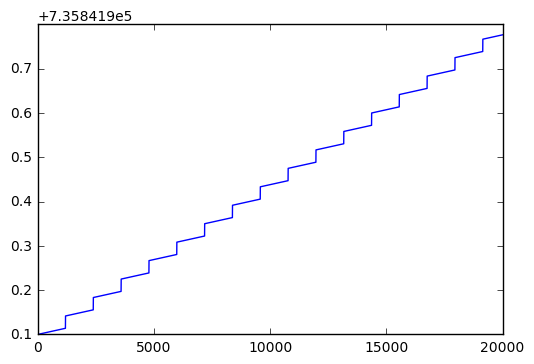

In [15]:
plt.plot(f['data_times'][0:20000])

In [41]:
num2date(f['data_times'][2390:2405])

[datetime.datetime(2015, 9, 1, 1, 19, 59, 843870, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 0, 65160, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 1, 68223, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 2, 71275, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 3, 74337, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 4, 76394, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 5, 79446, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 6, 82509, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 7, 85561, tzinfo=<matplotlib.dates._UTC object at 0x10a4abe10>),
 datetime.datetime(2015, 9, 1, 2, 0, 8, 88623, tzinfo=<matplotlib.dates._UTC ob

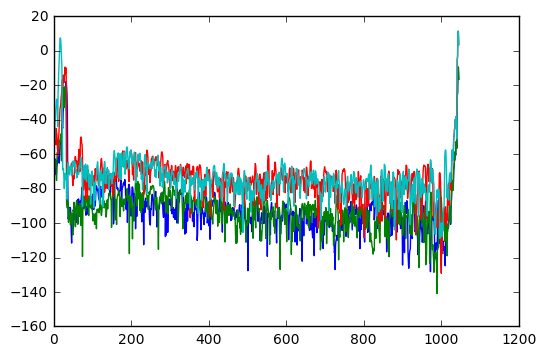

In [42]:
plt.plot(f['Sv'][0,:,28717])
plt.hold(True)
plt.plot(f['Sv'][0,:,0])
plt.plot(f['Sv'][0,:,1194])
plt.plot(f['Sv'][0,:,2391])

# Load 1 month of data

In [1]:

import os, sys, re
import h5py
import datetime
import math
import numpy as np
from matplotlib.dates import date2num, num2date
import matplotlib.pylab as plt
from modest_image import imshow
from calendar import monthrange

data_path = '/Volumes/wjlee_apl_2/ooi_zplsc_h5_figs'
h5_fname = 'CE04OSPS_201509.h5'

f = h5py.File(os.path.join(data_path,h5_fname))

# Get month and day range
H5_FILENAME_MATCHER = re.compile('(?P<SITE_CODE>\S*)_(?P<YearMonth>\S*)\.\S*')
ym = datetime.datetime.strptime(H5_FILENAME_MATCHER.match(h5_fname).group('YearMonth'),'%Y%m')
year = ym.year
month = ym.month
_,daynum = monthrange(year,month)

# Get datetime object for on the hour every hour in all days in the month
all_day = range(1,daynum+1)  # list of all days
all_hr = range(24)  # list of all hour: 0-23
all_minutes = range(1,11)  # list of all minutes: 0-9
every_hr = [datetime.datetime(year,month,day,hr,minutes,0) \
            for day in all_day for hr in all_hr for minutes in all_minutes]

# Function to find nearest element
def find_nearest_time_idx(all_timestamp_num,time_wanted):
    time_wanted_num = date2num(time_wanted)
    idx = np.searchsorted(all_timestamp_num, time_wanted_num, side="left")
    if idx > 0 and (idx == len(all_timestamp_num) or \
        math.fabs(time_wanted_num - all_timestamp_num[idx-1]) < math.fabs(time_wanted_num - all_timestamp_num[idx])):
        return idx-1
    else:
        return idx


In [2]:
%time data_times_all = f['data_times']

CPU times: user 522 µs, sys: 318 µs, total: 840 µs
Wall time: 50.8 ms


In [3]:
%time all_idx = [find_nearest_time_idx(data_times_all,hr) for hr in every_hr]

CPU times: user 23.7 s, sys: 14.5 s, total: 38.1 s
Wall time: 41.2 s


In [4]:
%time all_idx = [find_nearest_time_idx(f['data_times'],hr) for hr in every_hr]

CPU times: user 23.2 s, sys: 13.2 s, total: 36.4 s
Wall time: 37.2 s


In [5]:
%time Sv_mtx = f['Sv'][:,:,all_idx]

CPU times: user 3min 54s, sys: 23.4 s, total: 4min 18s
Wall time: 10min 18s


In [6]:
%time data_times = f['data_times'][all_idx]

CPU times: user 6.55 s, sys: 74.7 ms, total: 6.62 s
Wall time: 6.62 s


In [7]:
%matplotlib inline

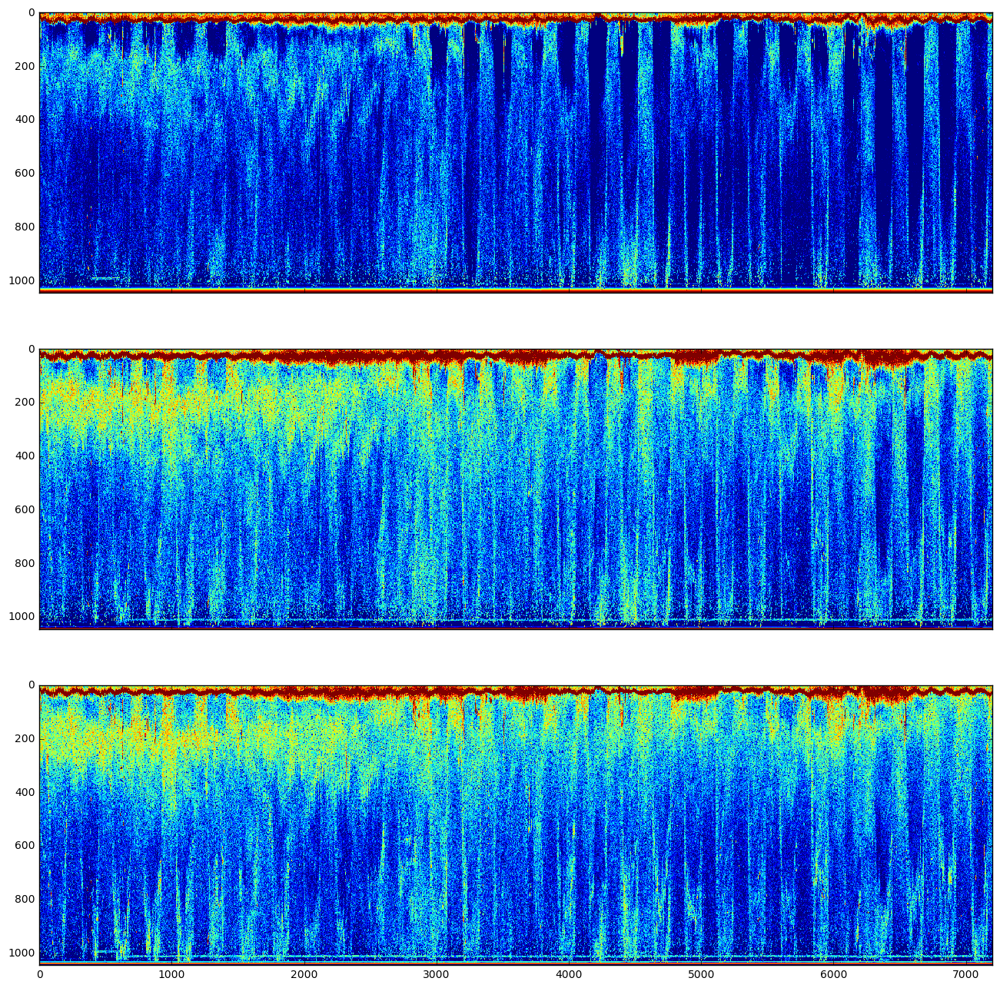

In [8]:
fig, ax = plt.subplots(3, sharex=True)
for ff in range(Sv_mtx.shape[0]):
    imshow(ax[ff],Sv_mtx[ff,:,:],aspect='auto',vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(16)
fig.set_figheight(16)

In [9]:
f.close()

In [10]:
type(Sv_mtx)

numpy.ndarray

In [146]:
(np.transpose(all_day),np.transpose(all_hr),np.transpose(all_minutes))

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]))

In [147]:
vec_len_each_day = len(all_hr)*len(all_minutes)*Sv_mtx.shape[1]

In [148]:
(vec_len_each_day,240*1046)

(251040, 251040)

In [163]:
Sv_mtx.shape

(3, 1046, 7200)

In [164]:
Sv_mtx_0 = Sv_mtx[0,:,:]

In [168]:
Sv_mtx_0.shape

(1046, 7200)

In [171]:
Sv_mtx_0

array([[-43.10902442, -48.49463918, -49.8234044 , ..., -58.93661716,
        -56.90231289, -59.99492574],
       [-43.9677453 , -51.39942332, -46.78990151, ..., -57.42002323,
        -56.13829396, -56.7027252 ],
       [-44.79119724, -47.78973821, -48.75397491, ..., -56.71480722,
        -63.09993565, -55.15086232],
       ..., 
       [ 11.30552276,  11.30552276,  11.30552276, ...,  11.31728174,
         11.32904073,  11.31728174],
       [ 11.43487158,  11.43487158,  11.43487158, ...,  11.44663057,
         11.45838955,  11.44663057],
       [  3.56811115,   3.56811115,   3.56811115, ...,   3.57987014,
          3.57987014,   3.57987014]])

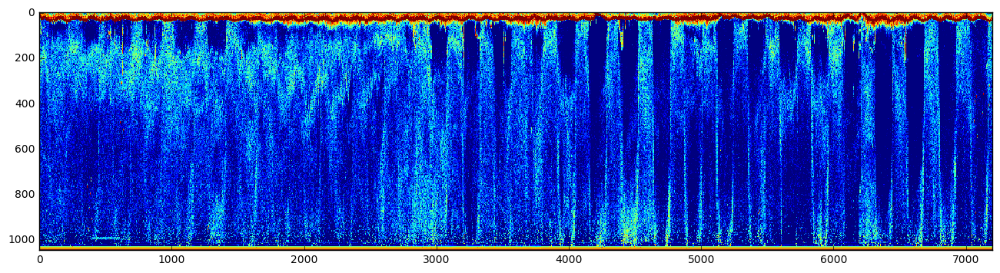

In [167]:
fig,ax=plt.subplots(1)
imshow(ax,Sv_mtx_0,aspect='auto',vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(16)

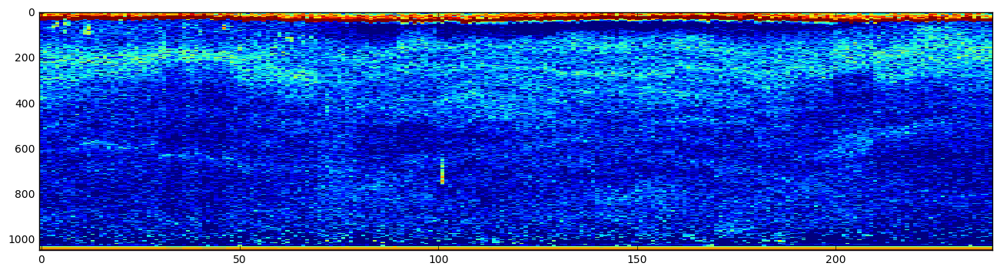

In [309]:
fig,ax=plt.subplots(1)
imshow(ax,Sv_mtx_0[:,0:240],aspect='auto',vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(16)

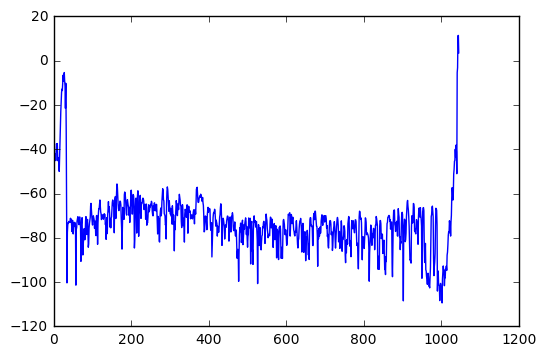

In [264]:
plt.plot(Sv_mtx_0[:,0])

In [311]:
num2date(data_times[0:240])

[datetime.datetime(2015, 9, 1, 0, 1, 0, 343788, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 1, 59, 528178, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 2, 59, 707625, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 3, 59, 890058, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 5, 0, 72502, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 6, 0, 253950, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 7, 0, 437389, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 7, 59, 615775, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 8, 59, 799214, tzinfo=<matplotlib.dates._UTC object at 0x10a4c30d0>),
 datetime.datetime(2015, 9, 1, 0, 9, 59, 981658, tzinfo=<matplotlib.d

In [268]:
0

In [269]:
Sv_mtx_rshp.shape

(30, 251040)

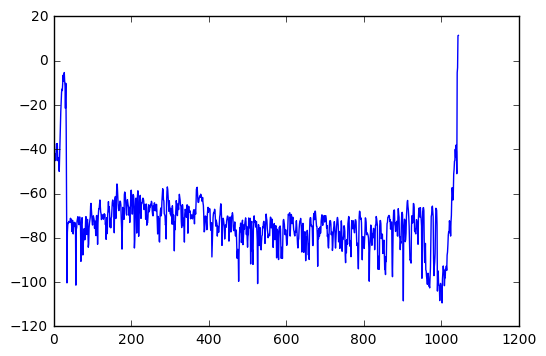

In [270]:
plt.plot(Sv_mtx_rshp[0,0:1045])

In [272]:
Sv_mtx_rshp2 = np.reshape(np.transpose(Sv_mtx[0,:,:]),(-1,vec_len_each_day))

In [273]:
Sv_mtx_rshp2.shape

(30, 251040)

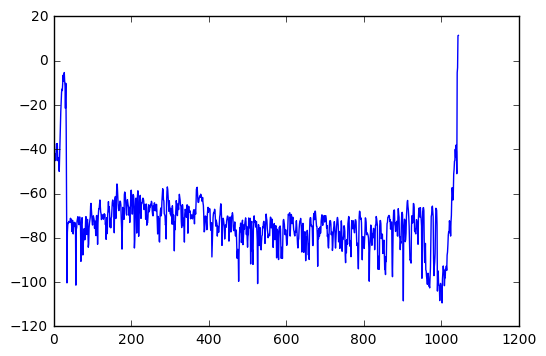

In [274]:
plt.plot(Sv_mtx_rshp2[0,0:1045])

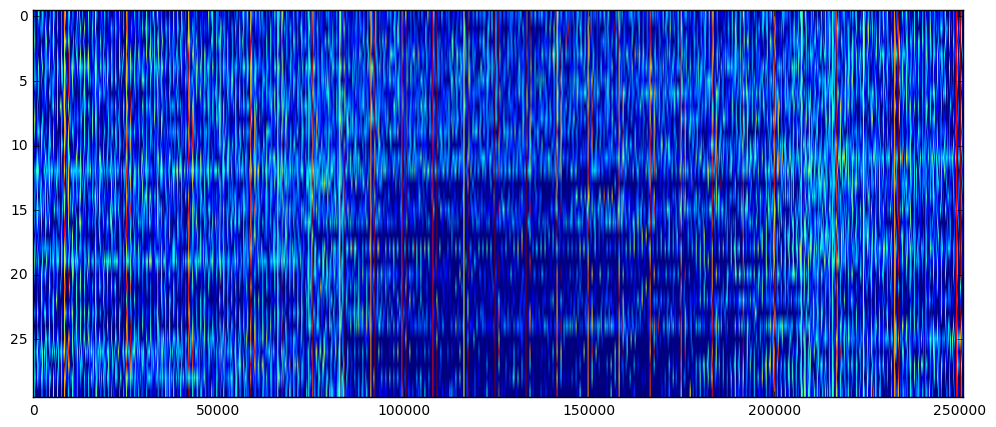

In [285]:
fig,ax=plt.subplots(1)
imshow(ax,Sv_mtx_rshp,aspect="auto",vmax=-34,vmin=-80)
fig.set_figwidth(12)
fig.set_figheight(5)

# Testing numpy.reshape()

In [245]:
a = np.arange(40)

In [246]:
a

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

In [247]:
a=np.reshape(a,(4,10))

In [248]:
a

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
       [30, 31, 32, 33, 34, 35, 36, 37, 38, 39]])

In [249]:
a.shape

(4, 10)

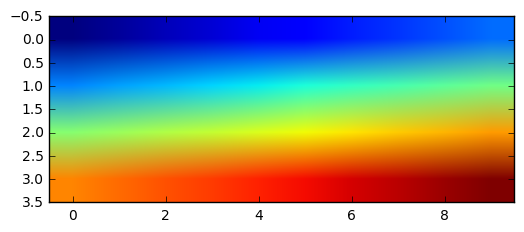

In [250]:
plt.imshow(a)

In [260]:
np.reshape(np.transpose(a),(-1,4))

array([[ 0, 10, 20, 30],
       [ 1, 11, 21, 31],
       [ 2, 12, 22, 32],
       [ 3, 13, 23, 33],
       [ 4, 14, 24, 34],
       [ 5, 15, 25, 35],
       [ 6, 16, 26, 36],
       [ 7, 17, 27, 37],
       [ 8, 18, 28, 38],
       [ 9, 19, 29, 39]])

In [564]:
np.reshape(a,(-1,5))

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14],
       [15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24],
       [25, 26, 27, 28, 29],
       [30, 31, 32, 33, 34],
       [35, 36, 37, 38, 39]])

# PCA on 38 kHz

In [137]:
from sklearn import decomposition

In [320]:
pca = decomposition.PCA(n_components=6,svd_solver='auto')

In [321]:
pca

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [322]:
pca.fit(Sv_mtx_rshp)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [323]:
V = pca.components_

In [324]:
V.shape

(6, 251040)

In [325]:
V

array([[  4.04516405e-04,   3.65622419e-04,   6.11052337e-04, ...,
          3.28530637e-06,   1.65883093e-06,   1.11278617e-06],
       [  1.91016147e-03,   2.15704309e-03,   2.41284709e-03, ...,
         -3.88242638e-07,   1.97593528e-06,   7.70806114e-07],
       [ -4.52769498e-04,   5.01772406e-05,  -1.49047657e-04, ...,
         -6.45899157e-07,  -1.31596241e-06,   1.43059616e-07],
       [  1.02211826e-03,   2.18767852e-03,   2.75726520e-03, ...,
          1.46307782e-06,   5.12530024e-07,  -6.88652568e-07],
       [  2.41197692e-04,   1.97445382e-04,  -6.10344860e-05, ...,
         -1.21201963e-06,   1.19584789e-06,   1.95359835e-06],
       [ -2.91538343e-03,  -3.14762850e-03,  -2.84923127e-03, ...,
          1.78930065e-06,  -1.51203082e-06,   4.82932559e-07]])

In [326]:
V_rshp=np.reshape(V,(-1,240,1046))

In [327]:
V_rshp.shape

(6, 240, 1046)

In [333]:
ax_v.shape

(2, 3)

In [345]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

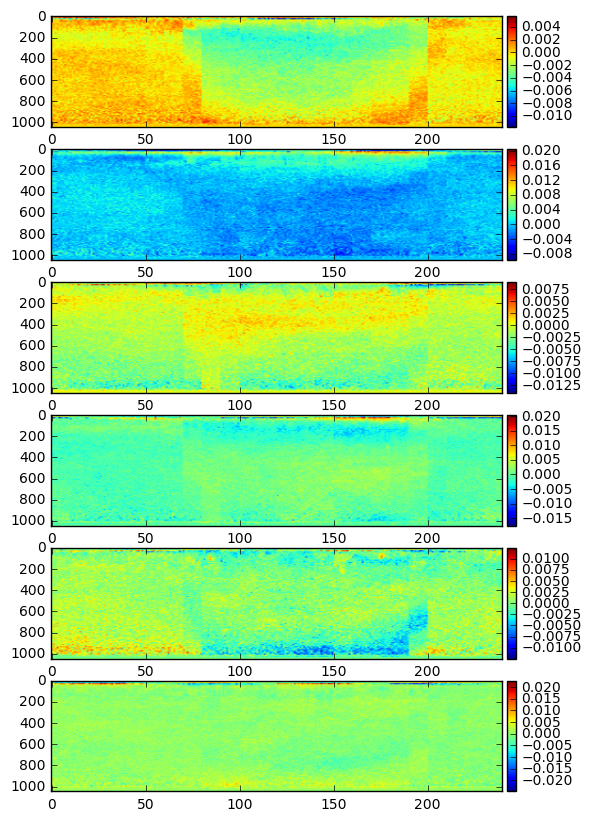

In [367]:
fig_v,ax_v = plt.subplots(6,sharey=True)
for comp in range(V_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(6)
fig_v.set_figheight(10)

In [352]:
Sv_mtx.shape

(3, 1046, 7200)

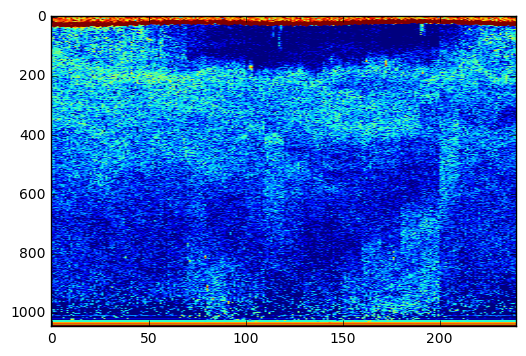

In [365]:
plt.imshow(Sv_mtx[0,:,4*240:5*240],aspect='auto',vmax=-34,vmin=-80)

In [442]:
pca.explained_variance_ratio_

array([ 0.16218245,  0.07743298,  0.07239565,  0.05465222,  0.04402952,
        0.04155396])

# ICA on 38 kHz

In [370]:
ica = decomposition.FastICA(n_components=6)
ica.fit(Sv_mtx_rshp)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
    n_components=6, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [371]:
V_ica = ica.components_

In [373]:
V_ica.shape

(6, 251040)

In [374]:
V_ica_rshp=np.reshape(V_ica,(-1,240,1046))

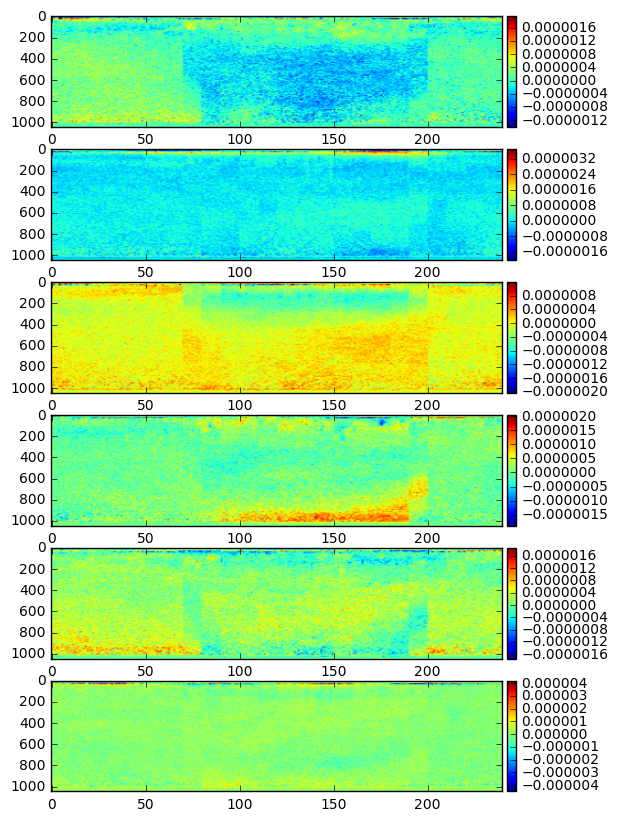

In [375]:
fig_v,ax_v = plt.subplots(6,sharey=True)
for comp in range(V_ica_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V_ica_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(6)
fig_v.set_figheight(10)

# NMF on 38kHz

In [380]:
Sv_mtx_rshp_nn = Sv_mtx_rshp-Sv_mtx_rshp.min()

In [381]:
Sv_mtx_rshp_nn.shape

(30, 251040)

In [443]:
nmf = decomposition.NMF(n_components=3)
nmf.fit(Sv_mtx_rshp_nn)

NMF(alpha=0.0, beta=1, eta=0.1, init=None, l1_ratio=0.0, max_iter=200,
  n_components=3, nls_max_iter=2000, random_state=None, shuffle=False,
  solver='cd', sparseness=None, tol=0.0001, verbose=0)

In [444]:
V_nmf = nmf.components_

In [445]:
V_nmf

array([[ 1.08963416,  1.08308632,  1.07272296, ...,  1.71650608,
         1.71780484,  1.63943808],
       [ 0.36158649,  0.34906362,  0.36066936, ...,  0.54807328,
         0.54839345,  0.52334436],
       [ 0.57249271,  0.58945031,  0.61259093, ...,  0.61427365,
         0.61495493,  0.58678151]])

In [446]:
V_nmf_rshp = np.reshape(V_nmf,(-1,240,1046))

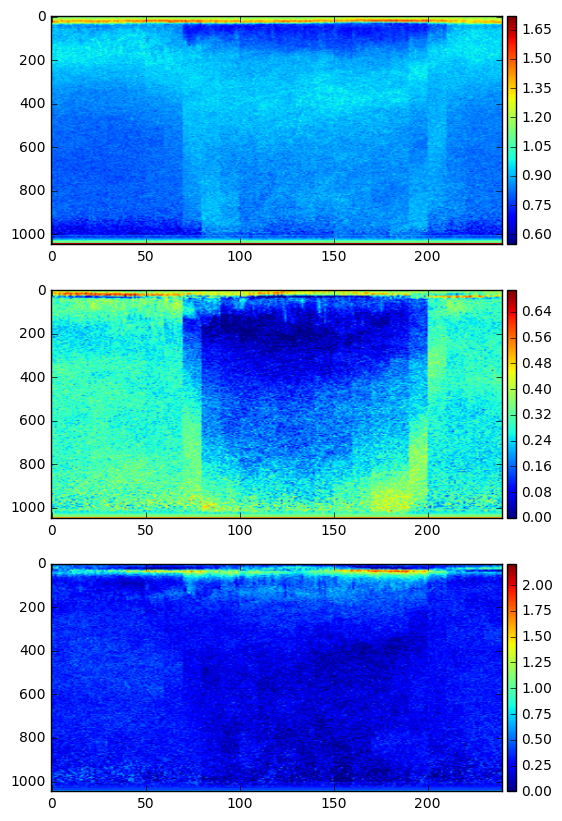

In [447]:
fig_v,ax_v = plt.subplots(3,sharey=True)
for comp in range(V_nmf_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V_nmf_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(6)
fig_v.set_figheight(10)

# Concatenate data from all 3 frequencies and do decomposition

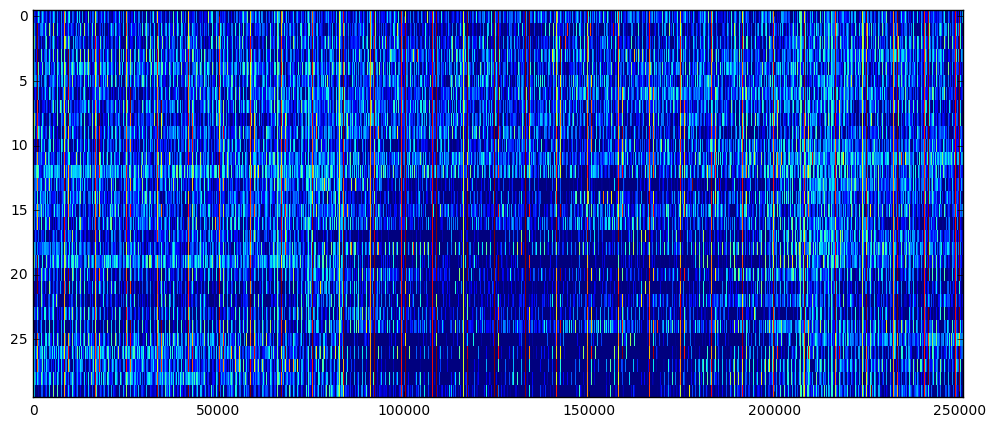

In [520]:
vec_len_each_day = len(all_hr)*len(all_minutes)*Sv_mtx.shape[1]  # length of vector for 1 day
Sv_mtx_test = np.reshape(np.transpose(Sv_mtx[0,:,:]),(-1,vec_len_each_day))

fig,ax=plt.subplots(1)
imshow(ax,Sv_mtx_test,aspect="auto",vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(12)
fig.set_figheight(5)

In [521]:
Sv_mtx_3freq_rshp = [np.reshape(np.transpose(Sv_mtx[band,:,:]),(-1,vec_len_each_day)) for band in range(3)]
Sv_mtx_3freq_rshp = np.asarray(Sv_mtx_rshp)

In [522]:
Sv_mtx_3freq_rshp.shape

(3, 30, 251040)

In [525]:
test = np.swapaxes(Sv_mtx_rshp,0,1)

In [526]:
test.shape

(30, 3, 251040)

In [528]:
test_rshp = np.reshape(test,[-1,3*vec_len_each_day])

In [529]:
test_rshp.shape

(30, 753120)

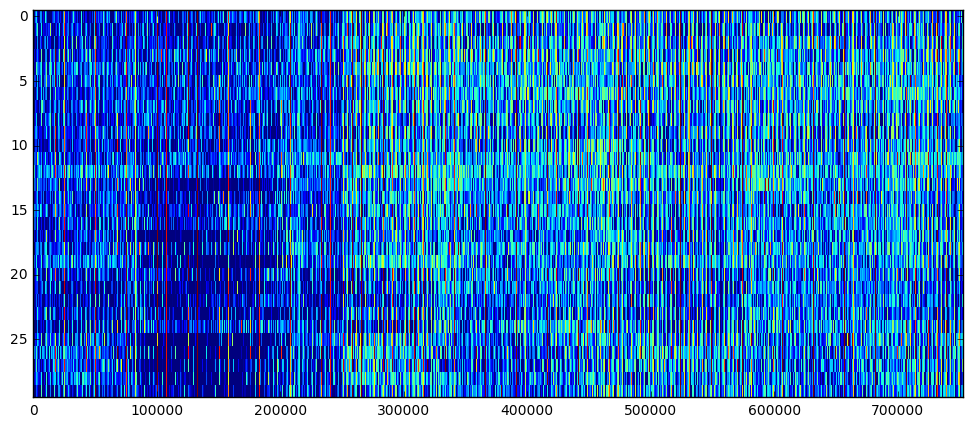

In [575]:
fig,ax=plt.subplots(1)
imshow(ax,test_rshp,aspect="auto",vmax=-34,vmin=-80,interpolation='none')
fig.set_figwidth(12)
fig.set_figheight(5)

In [583]:
test_rshp_rshp = np.reshape(test_rshp[0,:],(240*3,1046))

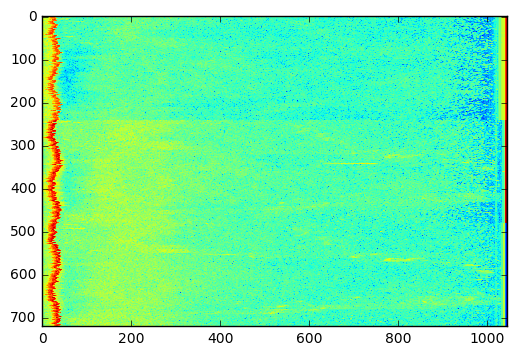

In [584]:
plt.imshow(test_rshp_rshp,aspect='auto',interpolation='none')

# PCA for all 3 frequencies of data

In [535]:
pca_3freq = decomposition.PCA(n_components=6,svd_solver='auto')
pca_3freq.fit(test_rshp)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [537]:
V3freq_pca = pca_3freq.components_

In [538]:
V3freq_pca.shape

(6, 753120)

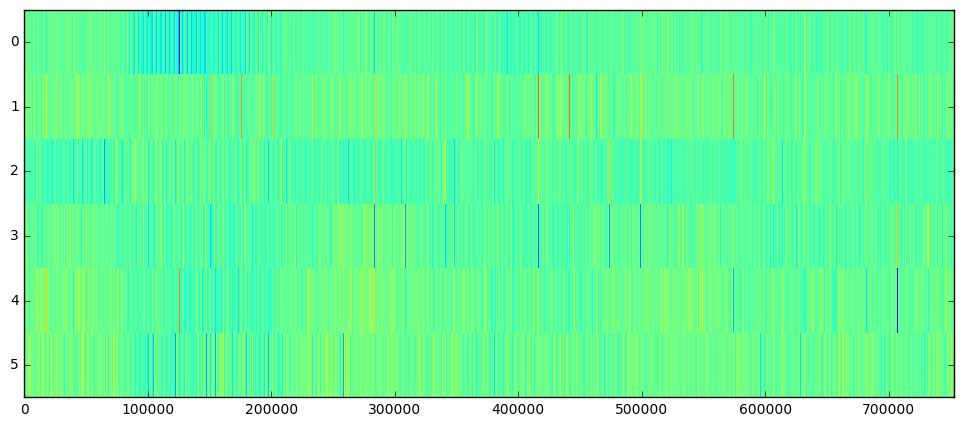

In [539]:
fig,ax=plt.subplots(1)
imshow(ax,V3freq_pca,aspect="auto",interpolation='none')
fig.set_figwidth(12)
fig.set_figheight(5)

In [562]:
V3freq_pca

array([[  4.34665499e-04,   4.55810262e-04,   7.04538793e-04, ...,
         -7.39692829e-07,   5.69904365e-07,   3.94679303e-04],
       [  1.36019499e-03,   1.61661651e-03,   1.88496157e-03, ...,
          2.64311317e-06,  -9.38784262e-07,  -1.86533902e-04],
       [  1.46943122e-04,   7.10570785e-04,   8.32849566e-04, ...,
         -3.64328131e-06,   1.59933329e-06,   5.11454060e-05],
       [  7.90440400e-04,   5.46745637e-04,   3.39661721e-04, ...,
         -8.88718863e-07,   2.33974273e-06,   6.02490591e-04],
       [ -1.11559654e-03,  -1.33477437e-03,  -1.54620572e-03, ...,
         -1.46068724e-06,  -7.02713578e-08,   7.13095813e-04],
       [  7.54333967e-04,   8.30181739e-04,   9.42284785e-04, ...,
          4.54282085e-06,   8.17296333e-06,  -8.01435593e-05]])

## Test to reshape 1 component

In [567]:
V3freq_pca_test=V3freq_pca[0,:]
V3freq_pca_test.shape

(753120,)

In [587]:
V3freq_pca_test_rshp=np.reshape(V3freq_pca_test,(240*3,1046))

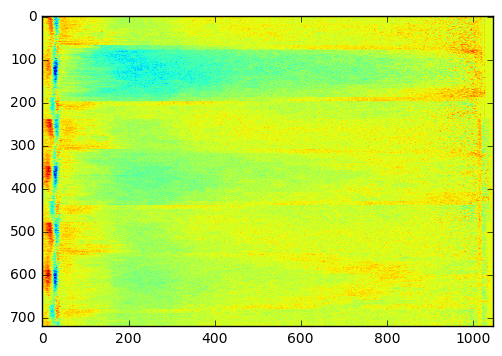

In [588]:
plt.imshow(V3freq_pca_test_rshp,)

## Reshape all components at once

In [593]:
V3freq_pca_rshp=np.reshape(V3freq_pca,(-1,240*3,1046))

In [594]:
V3freq_pca_rshp.shape

(6, 720, 1046)

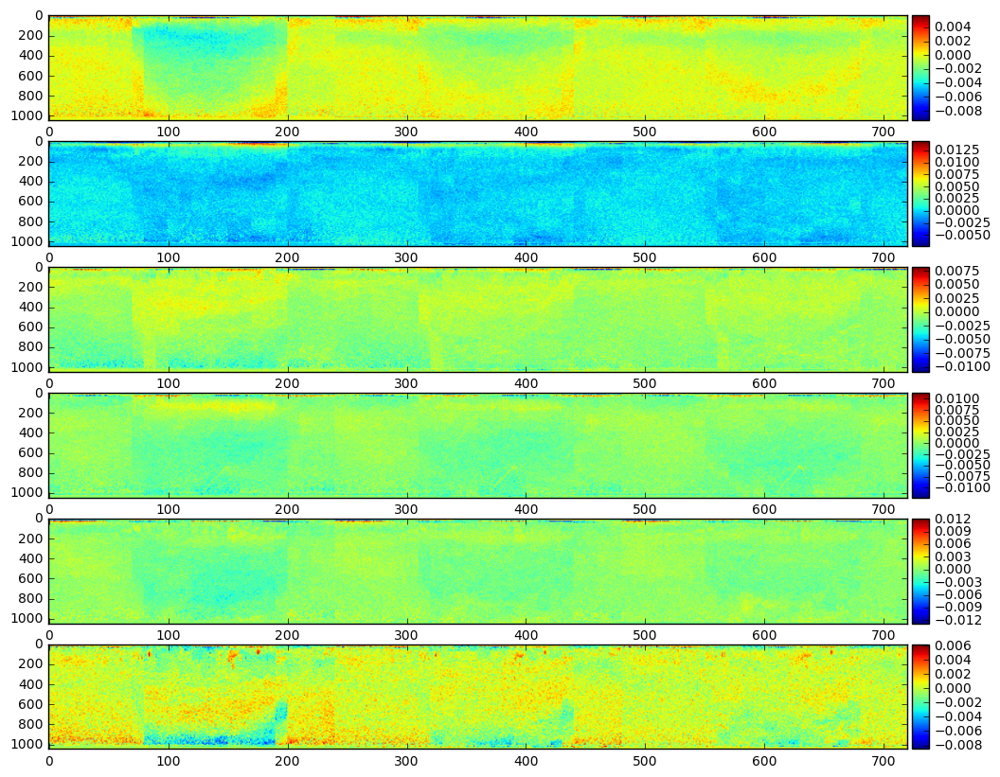

In [599]:
fig_v,ax_v = plt.subplots(6,sharey=True)
for comp in range(V3freq_pca_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V3freq_pca_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(12)
fig_v.set_figheight(10)

# NMF for all 3 frequencies of data

## 10 components

In [612]:
n_comp = 10;
test_rshp_nn = test_rshp - test_rshp.min()
nmf_3freq = decomposition.NMF(n_components=n_comp)
nmf_3freq.fit(test_rshp_nn)

NMF(alpha=0.0, beta=1, eta=0.1, init=None, l1_ratio=0.0, max_iter=200,
  n_components=10, nls_max_iter=2000, random_state=None, shuffle=False,
  solver='cd', sparseness=None, tol=0.0001, verbose=0)

In [613]:
V3freq_nmf = nmf_3freq.components_
V3freq_nmf.shape

(10, 753120)

In [614]:
V3freq_nmf_rshp=np.reshape(V3freq_nmf,(-1,240*3,1046))
V3freq_nmf_rshp.shape

(10, 720, 1046)

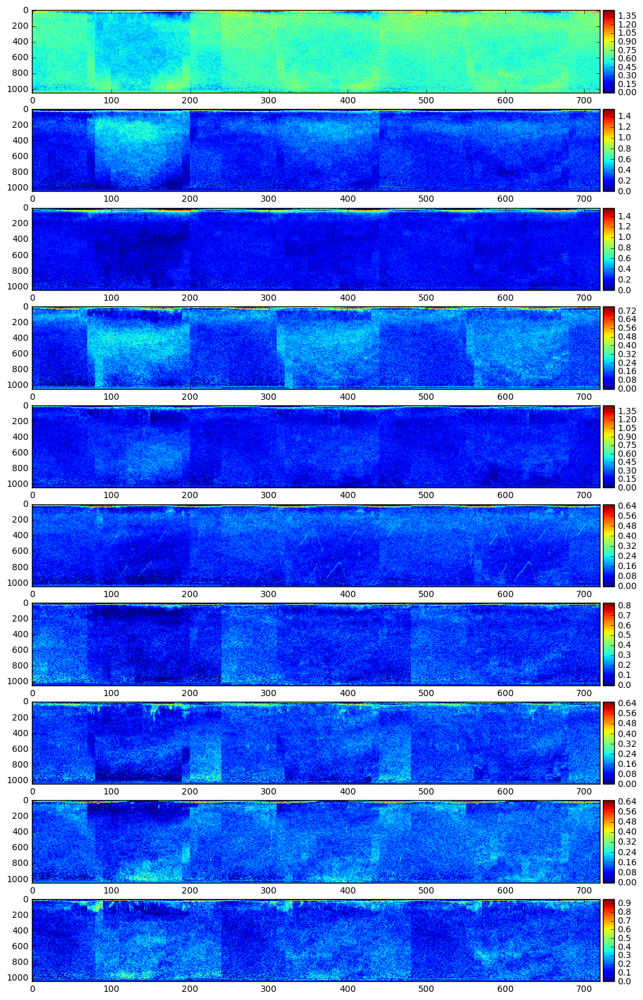

In [616]:
fig_v,ax_v = plt.subplots(n_comp,sharey=True,sharex=True)
for comp in range(V3freq_nmf_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V3freq_nmf_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(12)
fig_v.set_figheight(20)

## 3 components

In [624]:
n_comp = 6;
test_rshp_nn = test_rshp - test_rshp.min()
nmf_3freq = decomposition.NMF(n_components=n_comp)
nmf_3freq.fit(test_rshp_nn)
V3freq_nmf = nmf_3freq.components_
V3freq_nmf_rshp=np.reshape(V3freq_nmf,(-1,240*3,1046))

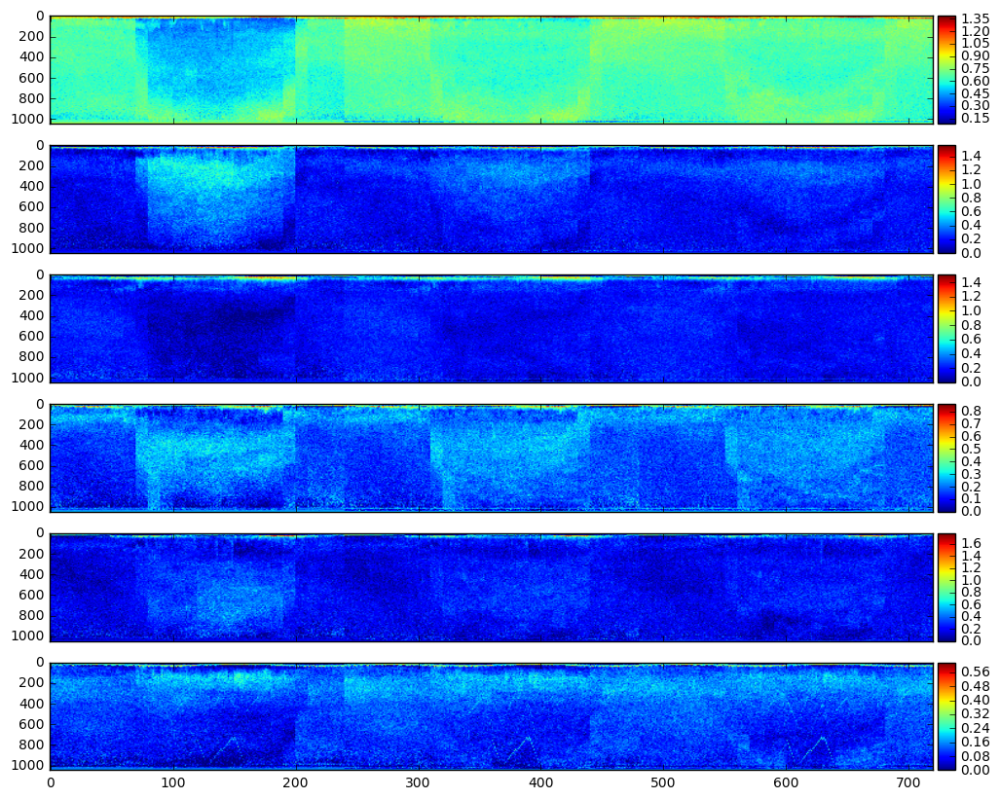

In [625]:
fig_v,ax_v = plt.subplots(n_comp,sharey=True,sharex=True)
for comp in range(V3freq_nmf_rshp.shape[0]):
    im = imshow(ax_v[comp],np.transpose(V3freq_nmf_rshp[comp,:,:]),aspect='auto')
    divider = make_axes_locatable(ax_v[comp])
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(im,cax=cax)
fig_v.set_figwidth(12)
fig_v.set_figheight(10)

## Put proper x-y labels on figure

In [635]:
h5_fname = 'CE04OSPS_201509.h5'

In [642]:
f = h5py.File(os.path.join(data_path,h5_fname))

In [644]:
bin_size=f['bin_size']

In [646]:
bin_size[0]

0.19121777

In [649]:
whos

Variable                Type           Data/Info
------------------------------------------------
H5_FILENAME_MATCHER     SRE_Pattern    <_sre.SRE_Pattern object at 0x10b1607d8>
Sv_mtx                  ndarray        3x1046x7200: 22593600 elems, type `float64`, 180748800 bytes (172 Mb)
Sv_mtx_0                ndarray        1046x7200: 7531200 elems, type `float64`, 60249600 bytes (57 Mb)
Sv_mtx_3freq_rshp       ndarray        3x30x251040: 22593600 elems, type `float64`, 180748800 bytes (172 Mb)
Sv_mtx_rshp             ndarray        3x30x251040: 22593600 elems, type `float64`, 180748800 bytes (172 Mb)
Sv_mtx_rshp2            ndarray        30x251040: 7531200 elems, type `float64`, 60249600 bytes (57 Mb)
Sv_mtx_rshp_nn          ndarray        30x251040: 7531200 elems, type `float64`, 60249600 bytes (57 Mb)
Sv_mtx_test             ndarray        30x251040: 7531200 elems, type `float64`, 60249600 bytes (57 Mb)
V                       ndarray        6x251040: 1506240 elems, type `float64`,

In [650]:
data_times

array([ 735842.00069842,  735842.00138343,  735842.00207995, ...,
        735871.96388318,  735871.96457971,  735871.96527627])

In [658]:
timestamp = ["%02d:%02d" % (all_hr[x],0) for x in range(23)]

In [660]:
timestamp[0]

'00:00'

In [661]:
vec_len_each_day

251040

In [667]:
timetick = [x*len(all_minutes) for x in all_hr]

In [681]:
depth_max = bin_size[0]*1045

In [682]:
depth_max

199.82256464660168

In [683]:
f.close()